# WINE CLUSTERING USING K-MEANS

In [68]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd

In [2]:
# Loading the DataSet
df = pd.read_csv("F:\IVY\PYTHON\Clustering\wine-clustering.csv")

In [3]:
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [4]:
# Checkign for missing values
df.isnull().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
dtype: int64

In [8]:
# Checking the shape of the dataset
df.shape

(178, 13)

In [63]:
# Converting the data into arrays
X = df.values
X

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 3.920e+00, 1.065e+03,
        0.000e+00],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 3.400e+00, 1.050e+03,
        0.000e+00],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 3.170e+00, 1.185e+03,
        0.000e+00],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 1.560e+00, 8.350e+02,
        1.000e+00],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 1.620e+00, 8.400e+02,
        1.000e+00],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 1.600e+00, 5.600e+02,
        1.000e+00]])

[2314.0, 1659.0079672511501, 1277.928488844642, 1175.428333103347, 1101.6176864100873, 1045.0320527662686, 990.8167170771733, 929.9817979515112, 906.4327169426186, 869.7948627541743]


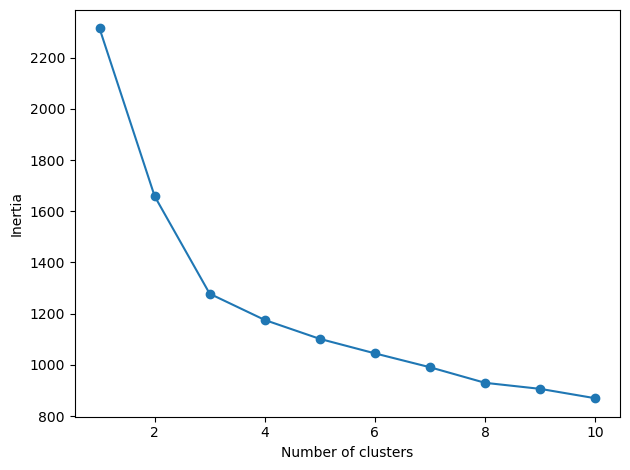

In [53]:
# Finding the best number of clusters based on the inertia value
%matplotlib inline
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
inertiaValue = []
for i in range(1, 11):
    km = KMeans(n_clusters=i, 
                init='random',
                n_init=10, 
                max_iter=356, ###TOTAL ROWS * 2 , POPULATE THIS VALUE
                tol=1e-04,
                random_state=0)
    
    km.fit(X)
    inertiaValue.append(km.inertia_)
    
plt.plot(range(1, 11), inertiaValue, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.tight_layout()
#plt.savefig('elbow.png', dpi=300)
print(inertiaValue)
plt.show()

In [57]:
for k in range(2, 6):  
    kmeans = KMeans(n_clusters=k, random_state=42)  
    labels = kmeans.fit_predict(X)  
    score = silhouette_score(X, labels)  
    print(f"K={k}, Silhouette Score={score}")  

K=2, Silhouette Score=0.6568536504294317
K=3, Silhouette Score=0.5595823478987215
K=4, Silhouette Score=0.5669477723599623
K=5, Silhouette Score=0.5081797474674725


* k = 3 is maximum amount of clusters by inertia
* k = 2 is maximum amount of clusters by silloutte score

# k=3 Clusters

In [64]:
# Defining the K-Means object for best number of clusters. n=3 in this case
km = KMeans(n_clusters=3, 
            init='random', 
            n_init=10, 
            max_iter=300,
            tol=1e-04,
            random_state=3)

In [65]:
# Running the clustering algorithm on the data set
predictedCluster = km.fit_predict(X)
print(predictedCluster)
print('Inertia:', km.inertia_)

[2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 2 2 0 0 2 2 0 2 2 2 2 2 2 0 0
 2 2 0 0 2 2 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 0 1 0 1 1 0 1 1 0 0 0 1 1 2
 0 1 1 1 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1
 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 1 1 1 0 0 1 1 0 0 1 0
 0 1 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 1]
Inertia: 2370696.6545249037


In [66]:
df['PredictedCluster'] = predictedCluster
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,PredictedCluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0


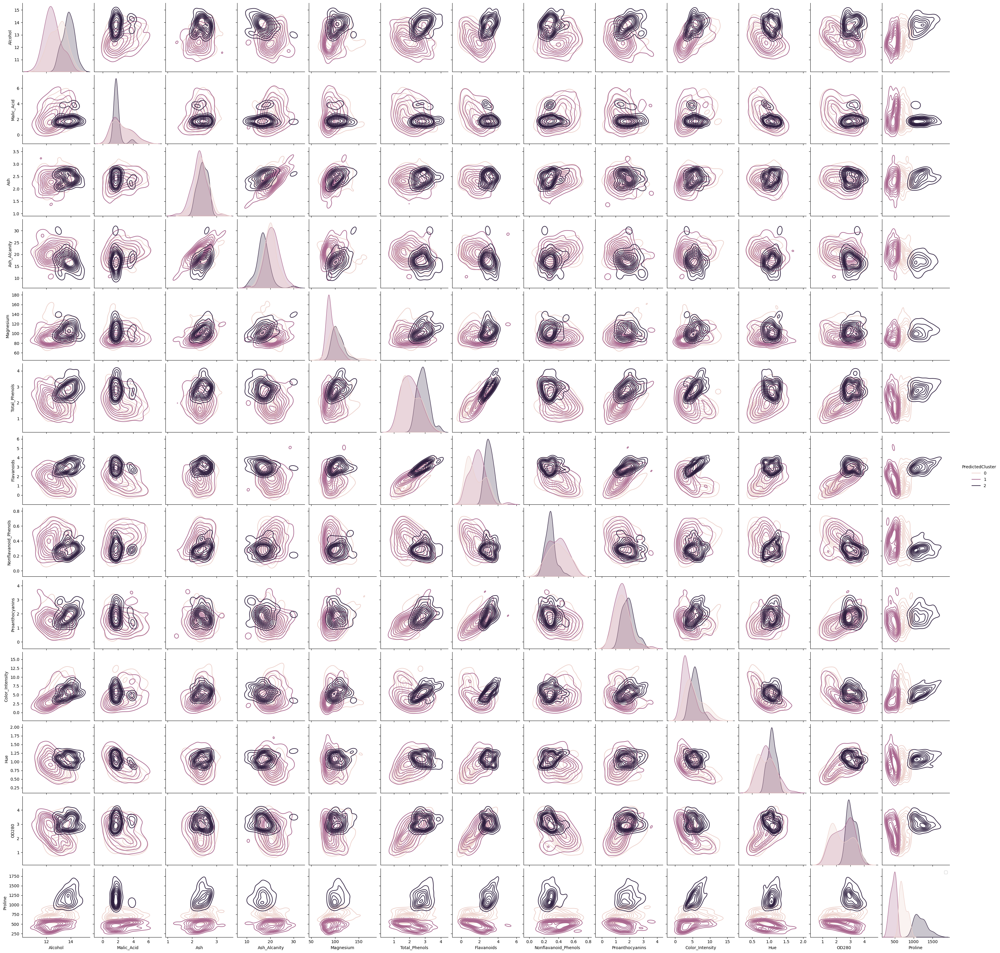

In [67]:
# Pair plot to visualize the clusters when k = 3
import seaborn as sns
sns.pairplot(df, hue="PredictedCluster", kind='kde')
plt.legend()
plt.show()

# k = 2 Clusters

In [58]:
# Defining the K-Means object for best number of clusters. n=3 in this case
km = KMeans(n_clusters=2, 
            init='random', 
            n_init=10, 
            max_iter=300,
            tol=1e-04,
            random_state=3)

In [59]:
# Running the clustering algorithm on the data set
predictedCluster = km.fit_predict(X)
print(predictedCluster)
print('Inertia:', km.inertia_)

[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Inertia: 4543749.614531861


In [60]:
df['PredictedCluster'] = predictedCluster
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,PredictedCluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1


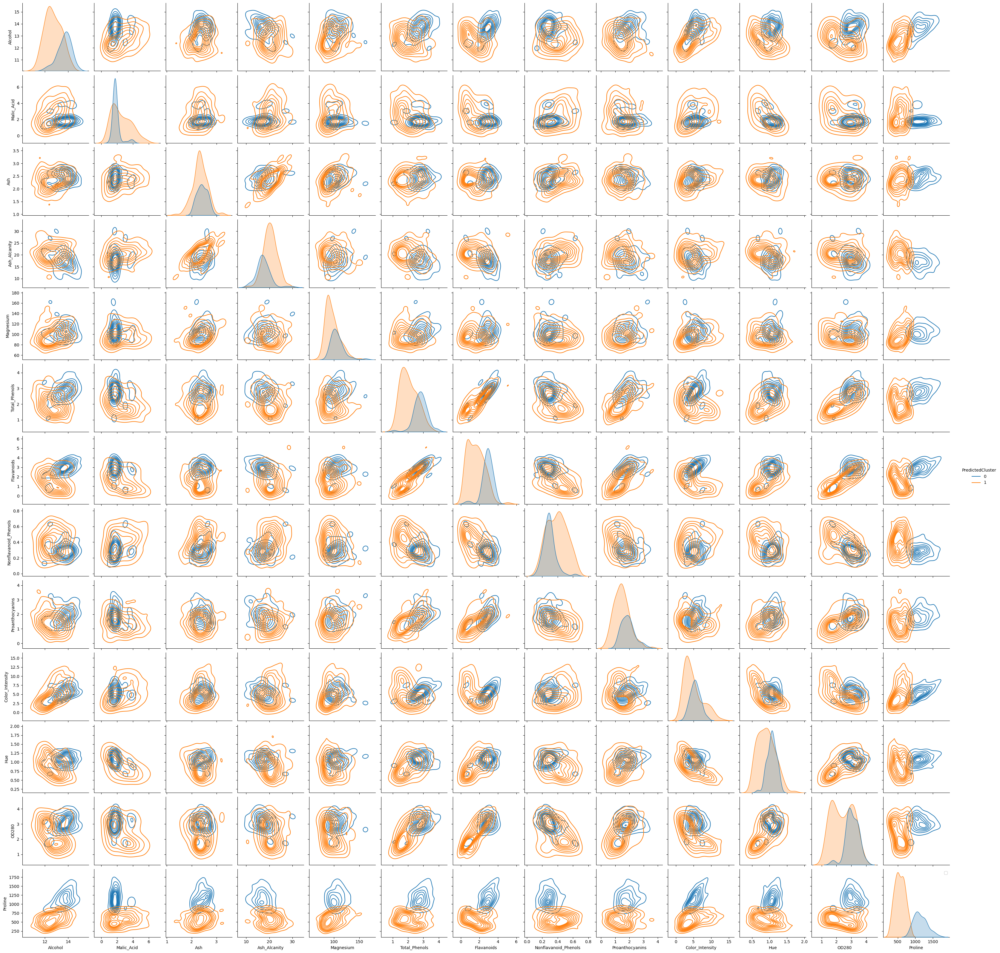

In [62]:
# Pair plot to visualize the clusters when k =2
import seaborn as sns
sns.pairplot(df, hue="PredictedCluster", kind='kde')
plt.legend()
plt.show()

### **Final Interpretation for Wine Clusters**  

**1. Summary of Clustering Analysis:**  
- We performed **K-Means clustering** on the wine dataset.  
- Based on the **Elbow Method (Inertia)**, **K=3** was suggested.  
- Based on the **Silhouette Score**, **K=2 was the best choice (0.657)**, indicating better-separated clusters.  
- **Pair plots** confirmed that **K=2 provided the clearest separation** among clusters.

---

**2. Interpretation of Clusters (K=2 Chosen as Best Option):**  
- The dataset naturally divides into **two well-defined groups**.  
- The two clusters likely represent **two main wine categories** based on their chemical composition.  
- Differences between the clusters suggest **variations in alcohol content,color, or acidity levels**.  
- Feature importance (from pair plots) indicates that **some variables contribute significantly to cluster separation** (e.g.proline etc.).


---

**Final Conclusion:**  
**K=2 is the optimal number of clusters**, as it provides the best-separated groups. This segmentation can help in better understanding the composition and quality of different wines.However many of the clusters are not that clearly separated so this dataset migth not be best for clustering or other clustering methods should be used.  

---
